In [95]:
import pandas as pd
import numpy as np
import urllib
import os
import ast
import cv2
import matplotlib.pyplot as plt

from loguru import logger
from tqdm.notebook import tqdm
from matplotlib.patches import Rectangle

In [96]:
import tensorflow as tf
logger.info(f'Tensorflow version: {tf.__version__}')

2020-08-21 12:30:18.734 | INFO     | __main__:<module>:2 - Tensorflow version: 2.1.0


In [97]:
# check virtual env
# I am displaying this message for myself to know in the future in which virtual environment the code was running.
import sys
print(sys.executable)

/home/maw/anaconda3/envs/retinanet-env/bin/python


In [99]:
#!git clone https://github.com/fizyr/keras-retinanet.git

In [100]:
# %cd keras-retinanet/

# !pip install .

In [101]:
# !python setup.py build_ext --inplace

In [102]:
input_dir = '/home/maw/Desktop/kaggle/global-wheat-detection/small_dataset_1_4'
orginal_annot_path = '/home/maw/Desktop/kaggle/global-wheat-detection/train.csv'

In [103]:
def make_df_with_img_paths(input_dir):
            
    file_dict = {}
    
    for root, dirs, files in os.walk( input_dir ):
        for file in files:
            file_dict[file[:-4]] = os.path.join(input_dir, file)
    
    df = pd.DataFrame.from_dict(file_dict, orient='index').reset_index()
    df.columns=['image_id', 'image_path']
    
    return df
        
def divide_list_by_4(box):
    return [x / 4 for x in box]

def make_retina_input(bbox):
    return f"{int(float(bbox[0]))},\
             {int(float(bbox[1]))},\
             {int(float(bbox[0]))+int(float(bbox[2]))},\
             {int(float(bbox[1])) + int(float(bbox[3]))},wheat"

def make_dataframe_bboxes(orginal_annot_path, input_dir, size_divider=4):
    dfbb = pd.read_csv(orginal_annot_path)
    # make list from string
    dfbb['bbox'] = dfbb['bbox'].apply(ast.literal_eval)
    
    df = make_df_with_img_paths(input_dir)
    
    dfbb = dfbb.merge(df, on='image_id', how='left')
    
    dfbb['bbox_1_4'] = dfbb['bbox'].apply(divide_list_by_4)
    
    dfbb['retinanet_input_1_4'] = dfbb['bbox_1_4'].apply(make_retina_input)
    
    return dfbb[['image_id', 'image_path', 'bbox', 'bbox_1_4', 'retinanet_input_1_4']]

In [104]:
df = make_dataframe_bboxes(orginal_annot_path, input_dir, size_divider=4)
df.sample()

,image_id,image_path,bbox,bbox_1_4,retinanet_input_1_4
51818,fec6edf64,/home/maw/Desktop/kaggle/global-wheat-detectio...,"[560.0, 744.0, 251.0, 280.0]","[140.0, 186.0, 62.75, 70.0]","140, 186, 202, ..."


# display annotations
* 10 sample images

In [105]:
# draw an image with detected objects
def draw_image_with_boxes(filename, boxes_list):
    
    # load the image
    data = plt.imread(filename)
    
    # display size
    plt.figure(figsize=(6,6))
    
    # plot the image
    plt.imshow(data)
    
    # get the context for drawing boxes
    ax = plt.gca()
    
    # plot each box
    for box in boxes_list:
        # create the shape
        x1, y1, width, height = box
        rect = Rectangle((x1, y1), width, height, fill=False, color=  'red', linewidth=2 )
        # draw the box
        ax.add_patch(rect)
        
    # show the plot
    plt.show()

In [106]:
sample_images_ids = df['image_id'].drop_duplicates().sample(10).to_list()

In [107]:
sample_images_ids

['108c78542',
 '4ff1646a8',
 'c85eedb4c',
 'aa7eba834',
 '4f9eceb2b',
 'd01b29b85',
 'b28fb55cc',
 '408013a9d',
 '41c0123cc',
 'fc6860020']

Sample image num: 1, id: 108c78542


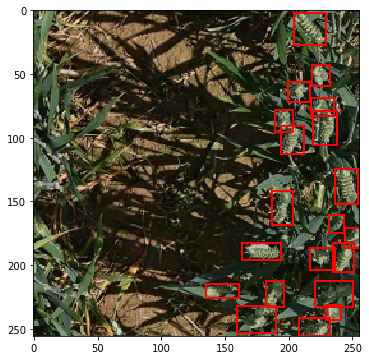

Sample image num: 2, id: 4ff1646a8


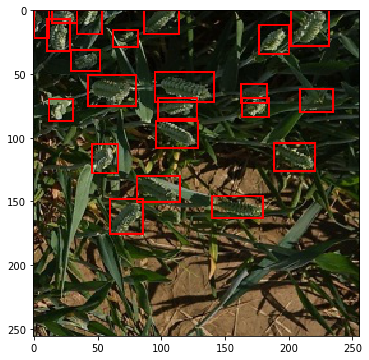

Sample image num: 3, id: c85eedb4c


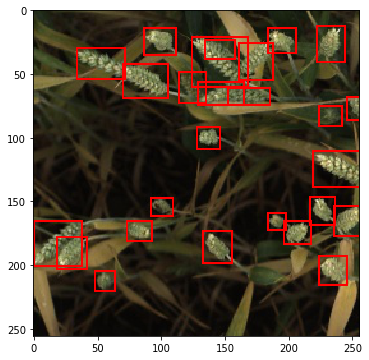

Sample image num: 4, id: aa7eba834


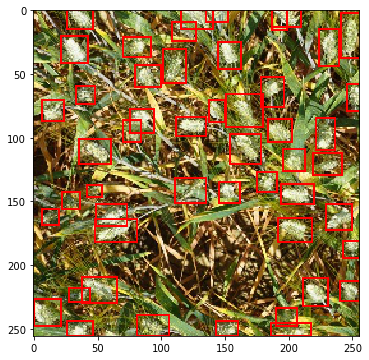

Sample image num: 5, id: 4f9eceb2b


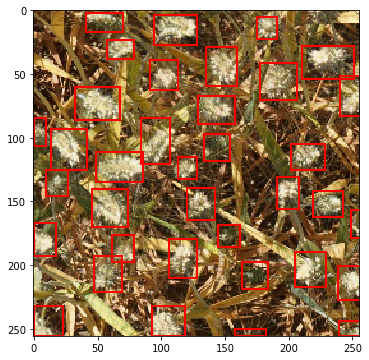

Sample image num: 6, id: d01b29b85


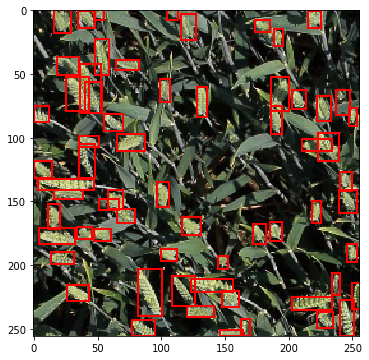

Sample image num: 7, id: b28fb55cc


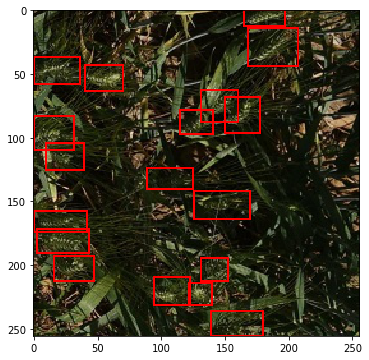

Sample image num: 8, id: 408013a9d


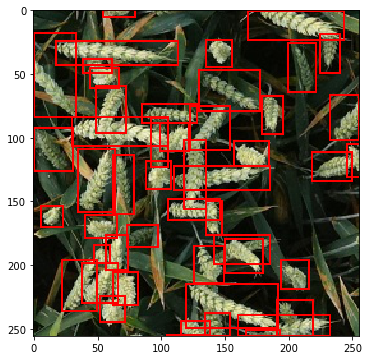

Sample image num: 9, id: 41c0123cc


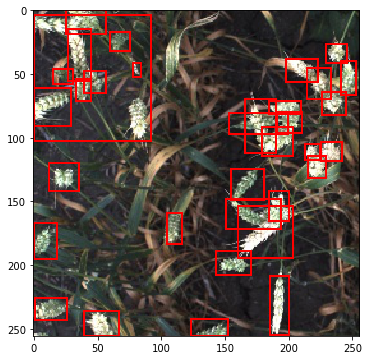

Sample image num: 10, id: fc6860020


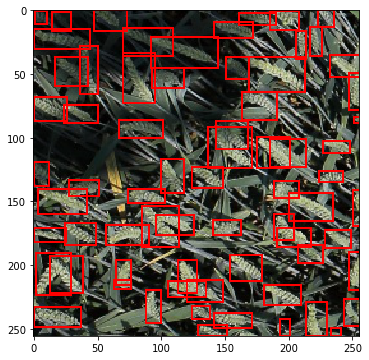

In [108]:
for img_num, img_id in enumerate(sample_images_ids):
    print(f'Sample image num: {img_num+1}, id: {img_id}')
    df_temp = df[df['image_id']==img_id]
    bbox_list = df_temp['bbox_1_4'].tolist()
    draw_image_with_boxes(df_temp['image_path'].iloc[0], bbox_list)

We can see that there are some **mistakes** in bboxes of dataset (Sample image num: 9, id: 41c0123cc - very large (not proper) binding box in the upper left corner). That could be corrected later.

The data set varies according to lighting and wheat species. Different photos show different numbers of wheat heads and the collection has no photos without wheat heads (I`ve checked it previously).

# model download

In [15]:
# first usage:
#URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
#urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

#print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

# first training:
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'

## model params

In [16]:
EPOCHS = 3
BATCH_SIZE=128
# a small number of steps due to the training time only
STEPS = 100 #len(df)//BATCH_SIZE 
LR=1e-3

## Training Model

In [17]:
# retinanet-debug csv '/home/maw/Desktop/kaggle/global-wheat-detection/notebooks/annotations.csv' '/home/maw/Desktop/kaggle/global-wheat-detection/notebooks/classes.csv'

In [18]:
!keras-retinanet/keras_retinanet/bin/train.py --random-transform --weights {PRETRAINED_MODEL} --lr {LR} --batch-size {BATCH_SIZE} --steps {STEPS} --epochs {EPOCHS} --no-resize csv '/home/maw/Desktop/kaggle/global-wheat-detection/notebooks/annotations.csv' '/home/maw/Desktop/kaggle/global-wheat-detection/notebooks/classes.csv'

Using TensorFlow backend.
2020-08-20 14:04:28.325751: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory
2020-08-20 14:04:28.325807: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory
2020-08-20 14:04:28.325815: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
Creating model, this may take a second...
2020-08-20 14:04:29.601215: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-08-20 14:04:29.604625: I tensorflow/stream_executor/cuda/cuda_gpu_e

Epoch 1/3
100/100 [==============================] - 3654s 37s/step - loss: 1.8683 - regression_loss: 1.4148 - classification_loss: 0.4535

Epoch 00001: saving model to ./snapshots/resnet50_csv_01.h5
/home/maw/anaconda3/envs/retinanet-env/lib/python3.7/site-packages/keras/callbacks/callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `mAP` which is not available. Available metrics are: loss,regression_loss,classification_loss,lr
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning
Epoch 2/3
100/100 [==============================] - 3897s 39s/step - loss: 1.6346 - regression_loss: 1.3013 - classification_loss: 0.3333

Epoch 00002: saving model to ./snapshots/resnet50_csv_02.h5
Epoch 3/3
100/100 [==============================] - 3839s 38s/step - loss: 1.4907 - regression_loss: 1.2091 - classification_loss: 0.2816

Epoch 00003: saving model to ./snapshots/resnet50_csv_03.h5


# predict

load model

In [19]:
!ls snapshots

_pretrained_model.h5  resnet50_csv_02.h5
resnet50_csv_01.h5    resnet50_csv_03.h5


In [12]:
from keras_retinanet import models

from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

In [21]:
model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)


Using TensorFlow backend.


tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-22.627417, -11.313708,  22.627417,  11.313708],
       [-28.50876 , -14.25438 ,  28.50876 ,  14.25438 ],
       [-35.918785, -17.959393,  35.918785,  17.959393],
       [-16.      , -16.      ,  16.      ,  16.      ],
       [-20.158737, -20.158737,  20.158737,  20.158737],
       [-25.398417, -25.398417,  25.398417,  25.398417],
       [-11.313708, -22.627417,  11.313708,  22.627417],
       [-14.25438 , -28.50876 ,  14.25438 ,  28.50876 ],
       [-17.959393, -35.918785,  17.959393,  35.918785]], dtype=float32)> anchors
tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-45.254833, -22.627417,  45.254833,  22.627417],
       [-57.01752 , -28.50876 ,  57.01752 ,  28.50876 ],
       [-71.83757 , -35.918785,  71.83757 ,  35.918785],
       [-32.      , -32.      ,  32.      ,  32.      ],
       [-40.317474, -40.317474,  40.317474,  40.317474],
       [-50.796833, -50.796833,  50.7

In [22]:
model_path

'snapshots/resnet50_csv_03.h5'

In [28]:
test_dir =  '/home/maw/Desktop/kaggle/global-wheat-detection/small_test_1_4'

In [24]:
li=os.listdir(test_dir)
li

['348a992bb.jpg',
 'cb8d261a3.jpg',
 '2fd875eaa.jpg',
 '53f253011.jpg',
 'cc3532ff6.jpg',
 'f5a1f0358.jpg',
 '51b3e36ab.jpg',
 'aac893a91.jpg',
 '796707dd7.jpg',
 '51f1be19e.jpg']

In [13]:
def predict(image):
    image = preprocess_image(image.copy())
    #image, scale = resize_image(image)

    boxes, scores, labels = model.predict_on_batch(
    np.expand_dims(image, axis=0)
  )
    print('='*10, '  ORG  ', '='*10)
    print(boxes)
    
    return boxes, scores, labels

In [14]:
def draw_detections(image, boxes, scores, labels, THRES_SCORE):
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
        if score < THRES_SCORE:
            break

        color = label_color(label)

        b = box.astype(int)
        draw_box(image, b, color=color)

        caption = "{:.3f}".format(score)
        draw_caption(image, b, caption)


In [15]:
def show_detected_objects(image_name, THRES_SCORE):
    img_path = test_dir+'/'+image_name
  
    image = read_image_bgr(img_path)

    boxes, scores, labels = predict(image)
    print(boxes[0,0].shape)
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    draw_detections(draw, boxes, scores, labels, THRES_SCORE)
    plt.figure(figsize=(15,10))
    plt.axis('off')
    plt.imshow(draw)
    plt.show()

==========   ORG   ==========
[[[148.12518  111.87213  179.447    135.92065 ]
  [182.63884   55.222122 217.7029    77.38129 ]
  [  0.        78.61841   28.59902  103.97046 ]
  ...
  [ 32.43679    0.        56.96673   25.594975]
  [218.23894  159.6924   253.19211  182.62527 ]
  [131.48991    0.       162.34914   16.957249]]]
(4,)


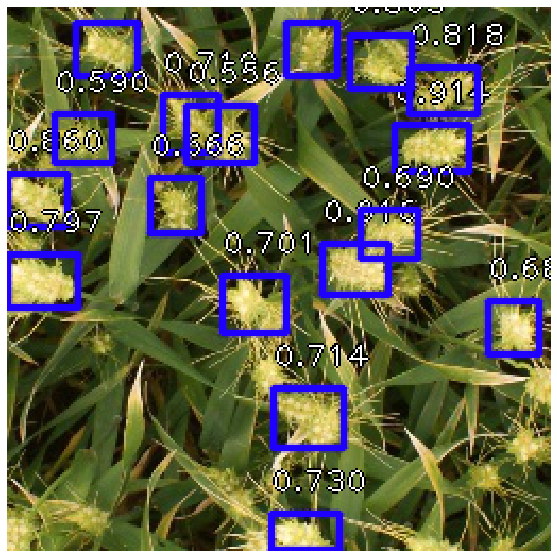

==========   ORG   ==========
[[[  6.4388375  139.80199     50.100277   165.1284    ]
  [ 77.00208     46.08895    101.12853     90.44963   ]
  [115.25883    231.78986    164.3284     255.        ]
  ...
  [  0.93458515 153.80103     24.199835   184.41266   ]
  [230.08966    208.12405    255.         231.32669   ]
  [180.57341      0.         212.33011     11.117044  ]]]
(4,)


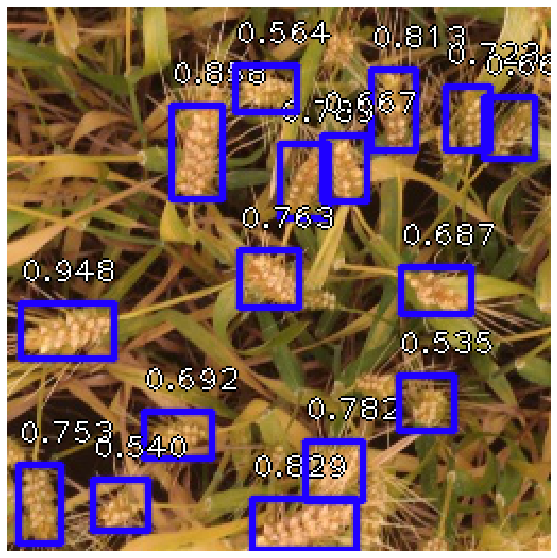

==========   ORG   ==========
[[[112.429886 123.13562  136.0508   157.30275 ]
  [ 24.714195 145.27344   61.113075 167.55083 ]
  [114.41603   87.903    147.1148   112.7435  ]
  ...
  [122.09853   72.40701  154.31575   99.21926 ]
  [ 35.770115  13.465017  63.63192   40.18857 ]
  [  0.        47.2114    17.090164 106.60479 ]]]
(4,)


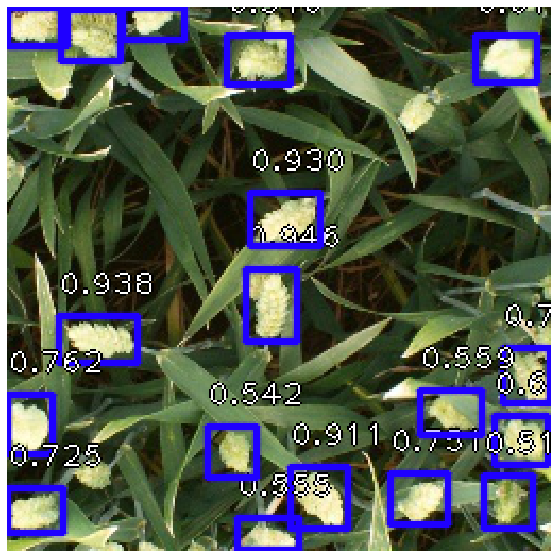

==========   ORG   ==========
[[[154.6393    26.089828 182.63852   60.594727]
  [116.081665 114.630974 155.46396  165.67784 ]
  [  4.780029 148.72424   33.621506 183.05267 ]
  ...
  [211.54805   69.81595  238.8912    95.88534 ]
  [ 60.19385   86.38408   89.88724  112.042076]
  [186.383    182.31085  215.88577  206.051   ]]]
(4,)


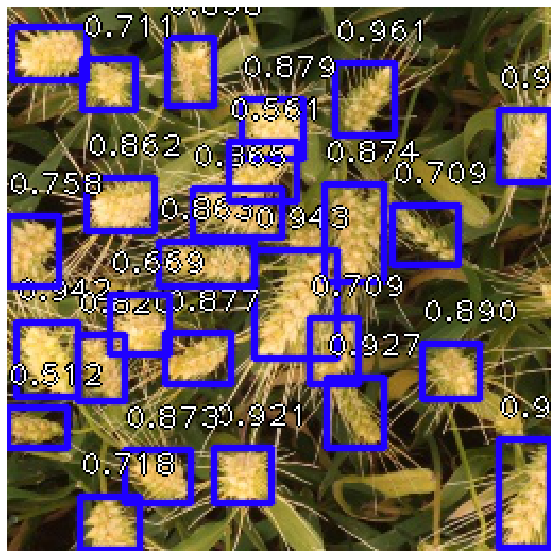

==========   ORG   ==========
[[[191.96217  208.6894   232.84561  246.92058 ]
  [121.2152   144.04744  145.15309  175.49197 ]
  [ 23.289175 152.52211   44.88162  187.70335 ]
  ...
  [ 11.042794 207.19698   43.143616 233.05792 ]
  [ 67.675476  43.228733  99.30558   67.995926]
  [234.83473    0.776803 255.        54.81134 ]]]
(4,)


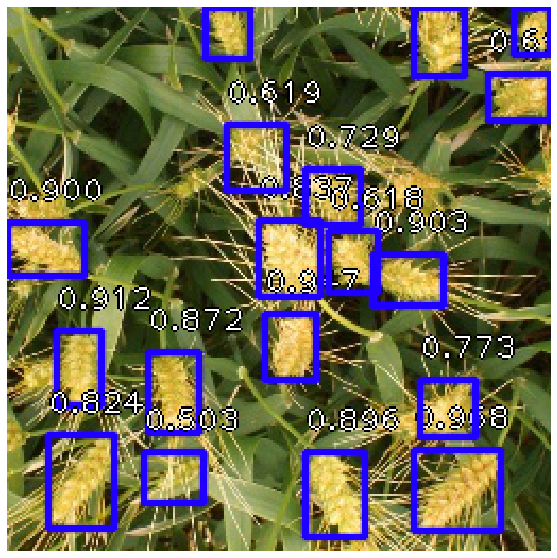

==========   ORG   ==========
[[[ 32.331703 187.84338   74.14842  217.92067 ]
  [235.4032   108.93943  255.       151.08879 ]
  [ 17.534359 115.30691   49.850037 144.83163 ]
  ...
  [ 54.23899   84.0276   107.48777  126.45979 ]
  [ 79.584274   0.       104.35856   16.688095]
  [164.60912  109.995766 194.71545  136.30948 ]]]
(4,)


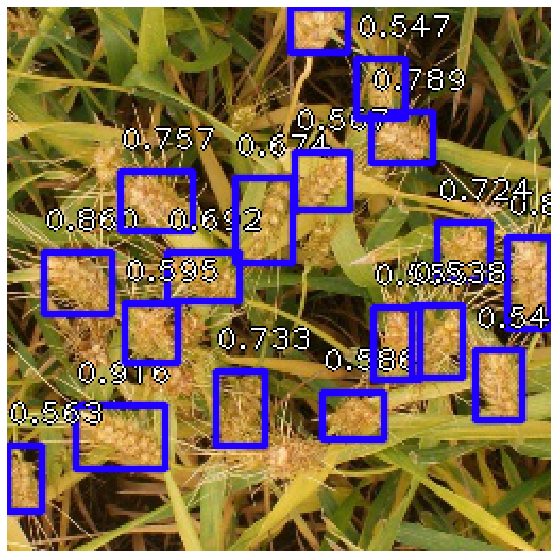

==========   ORG   ==========
[[[177.18997   205.67053   239.40886   232.50937  ]
  [ 56.155632  160.9631     82.448586  198.75354  ]
  [138.613       7.4357276 197.19823    40.617306 ]
  ...
  [ 52.037216    5.369072   78.65483    37.735153 ]
  [240.90837   215.74953   255.        239.46457  ]
  [220.04419   200.32288   248.24611   227.71123  ]]]
(4,)


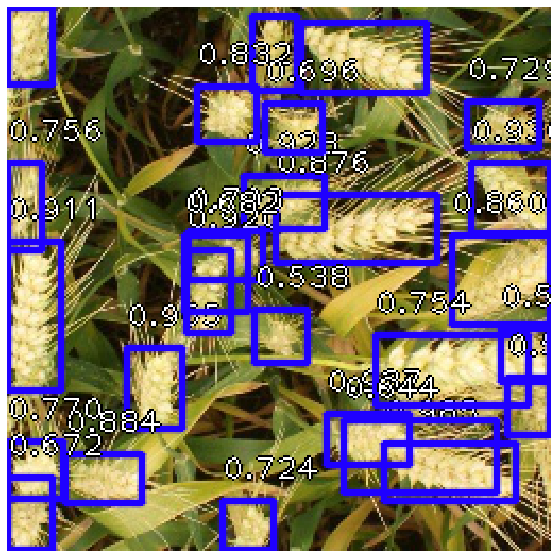

==========   ORG   ==========
[[[ 16.443853   0.        41.70828   37.259857]
  [ 61.486874  24.147995  92.425446  55.76402 ]
  [172.5912    98.93212  202.28104  140.77597 ]
  ...
  [193.82436  231.3721   218.05247  255.      ]
  [  5.250024  38.569687  35.06042   62.661137]
  [149.29047   94.122185 173.34137  124.00548 ]]]
(4,)


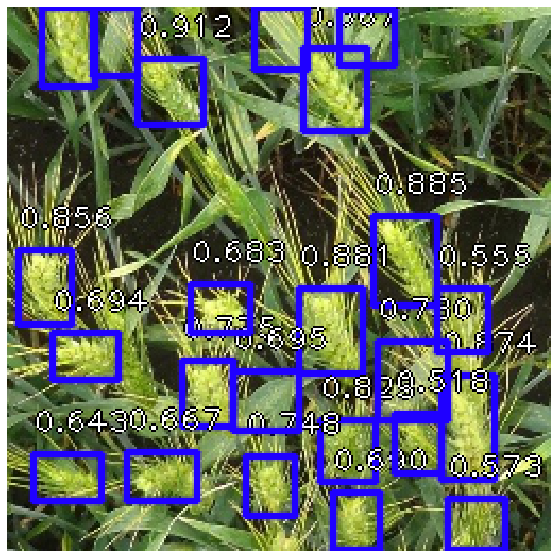

==========   ORG   ==========
[[[ 73.28407   71.30477   95.1971   102.349365]
  [ 10.055779  22.911266  46.651756  50.324352]
  [220.5151    82.20666  250.1373   104.72511 ]
  ...
  [212.27219  158.37364  238.57338  188.9386  ]
  [ 89.78266  133.72238  117.49901  162.1486  ]
  [ 49.348633 102.47838   76.28426  132.10457 ]]]
(4,)


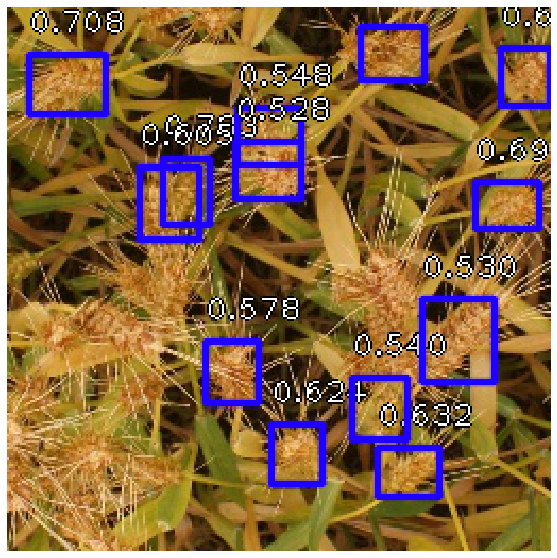

==========   ORG   ==========
[[[152.2735    21.69095  190.53065   59.237198]
  [218.02846  164.1502   253.65169  186.78046 ]
  [ 64.51921  116.514534 108.559906 149.2429  ]
  ...
  [ 90.503365  24.797672 121.22143   51.904114]
  [204.90002  142.75526  235.7042   168.43143 ]
  [ 98.13483  103.28096  125.15154  131.53535 ]]]
(4,)


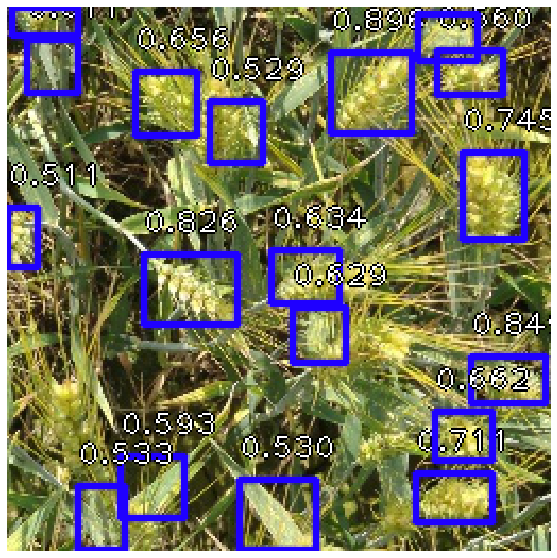

In [28]:
THRES_SCORE = 0.50

for img in li:
    show_detected_objects(img, THRES_SCORE)

# CONTINUATION - Training Model

In [29]:
# make another dir "snapshots" (otherwise will be replaced)
!mv snapshots snapshots0
!mkdir snapshots

In [31]:
# continue training --> model_path = last snapshot
PRETRAINED_MODEL_cont = model_path.replace('snapshots', 'snapshots0')

In [32]:
PRETRAINED_MODEL_cont

'snapshots0/resnet50_csv_03.h5'

In [21]:
EPOCHS = 1
BATCH_SIZE=128
STEPS = len(df)//BATCH_SIZE
LR=1e-5 # smaller lr

In [22]:
STEPS

1154

In [23]:
!keras-retinanet/keras_retinanet/bin/train.py --random-transform --weights {PRETRAINED_MODEL_cont} --lr {LR} --batch-size {BATCH_SIZE} --steps {STEPS} --epochs {EPOCHS} --no-resize csv '/home/maw/Desktop/kaggle/global-wheat-detection/notebooks/annotations.csv' '/home/maw/Desktop/kaggle/global-wheat-detection/notebooks/classes.csv'

Using TensorFlow backend.
2020-08-20 22:56:12.747004: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory
2020-08-20 22:56:12.747056: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory
2020-08-20 22:56:12.747065: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
Creating model, this may take a second...
2020-08-20 22:56:13.912527: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-08-20 22:56:13.924320: I tensorflow/stream_executor/cuda/cuda_gpu_e

Epoch 1/1
1154/1154 [==============================] - 39191s 34s/step - loss: 1.2640 - regression_loss: 1.0701 - classification_loss: 0.1939

Epoch 00001: saving model to ./snapshots/resnet50_csv_01.h5
/home/maw/anaconda3/envs/retinanet-env/lib/python3.7/site-packages/keras/callbacks/callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `mAP` which is not available. Available metrics are: loss,regression_loss,classification_loss,lr
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


# predict

load model

In [30]:
!ls snapshots

resnet50_csv_01.h5


In [31]:
model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-22.627417, -11.313708,  22.627417,  11.313708],
       [-28.50876 , -14.25438 ,  28.50876 ,  14.25438 ],
       [-35.918785, -17.959393,  35.918785,  17.959393],
       [-16.      , -16.      ,  16.      ,  16.      ],
       [-20.158737, -20.158737,  20.158737,  20.158737],
       [-25.398417, -25.398417,  25.398417,  25.398417],
       [-11.313708, -22.627417,  11.313708,  22.627417],
       [-14.25438 , -28.50876 ,  14.25438 ,  28.50876 ],
       [-17.959393, -35.918785,  17.959393,  35.918785]], dtype=float32)> anchors
tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-45.254833, -22.627417,  45.254833,  22.627417],
       [-57.01752 , -28.50876 ,  57.01752 ,  28.50876 ],
       [-71.83757 , -35.918785,  71.83757 ,  35.918785],
       [-32.      , -32.      ,  32.      ,  32.      ],
       [-40.317474, -40.317474,  40.317474,  40.317474],
       [-50.796833, -50.796833,  50.7

In [32]:
model_path

'snapshots/resnet50_csv_01.h5'

In [33]:
li=os.listdir(test_dir)
li

['348a992bb.jpg',
 'cb8d261a3.jpg',
 '2fd875eaa.jpg',
 '53f253011.jpg',
 'cc3532ff6.jpg',
 'f5a1f0358.jpg',
 '51b3e36ab.jpg',
 'aac893a91.jpg',
 '796707dd7.jpg',
 '51f1be19e.jpg']

### THRES_SCORE = 0.4

==========   ORG   ==========
[[[183.438     55.36637  217.86572   77.47727 ]
  [148.19098  110.57888  181.02885  137.05692 ]
  [  0.        78.744156  30.265114 104.456215]
  ...
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]]]
(4,)


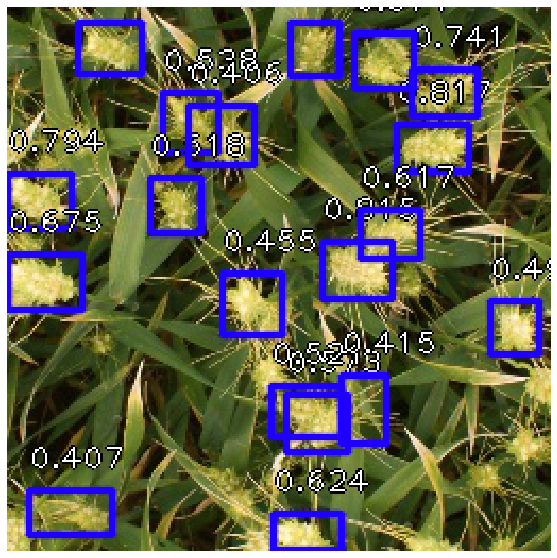

==========   ORG   ==========
[[[  6.0541964 137.94435    50.80122   165.73979  ]
  [171.05432    28.141678  192.14648    69.63561  ]
  [ 76.00964    39.890907  103.66555    92.132805 ]
  ...
  [ -1.         -1.         -1.         -1.       ]
  [ -1.         -1.         -1.         -1.       ]
  [ -1.         -1.         -1.         -1.       ]]]
(4,)


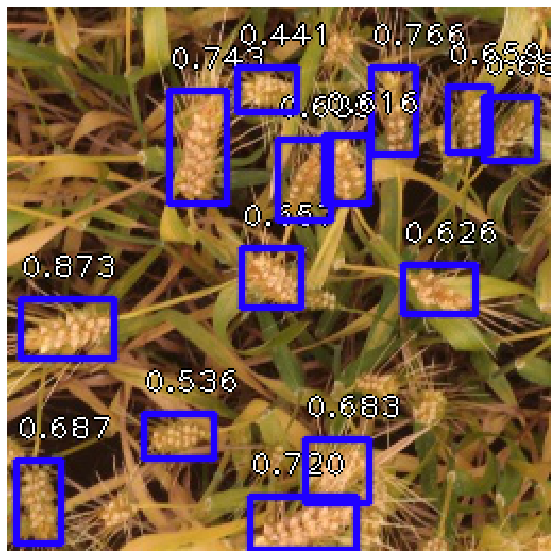

==========   ORG   ==========
[[[112.29272  122.032196 136.80788  158.09161 ]
  [114.37737   86.71717  147.86143  113.24479 ]
  [ 25.675457 144.9076    61.89223  167.8764  ]
  ...
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]]]
(4,)


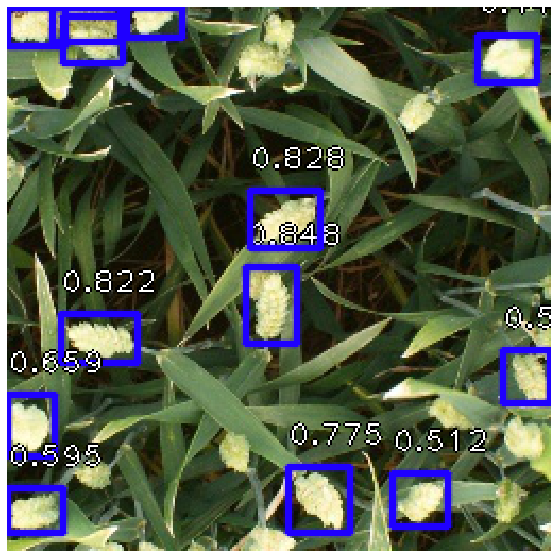

==========   ORG   ==========
[[[  4.4198365 147.74332    35.12231   184.38153  ]
  [230.79593   202.24767   255.        255.       ]
  [  3.1930156   7.456283   38.557064   35.678314 ]
  ...
  [123.16522    72.732155  156.92302    95.517525 ]
  [118.023926  216.41893   146.5046    243.87578  ]
  [104.17146   106.53329   126.781586  142.35997  ]]]
(4,)


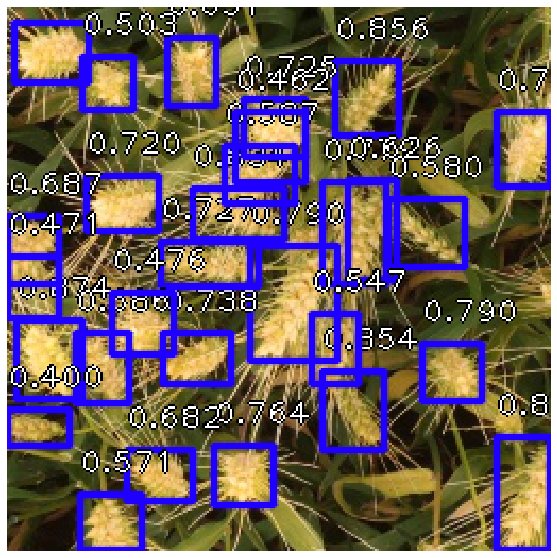

==========   ORG   ==========
[[[191.91812  206.90314  234.35287  248.41902 ]
  [  0.       100.03582   37.339985 127.55583 ]
  [ 23.249243 151.05342   45.644222 187.33553 ]
  ...
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]]]
(4,)


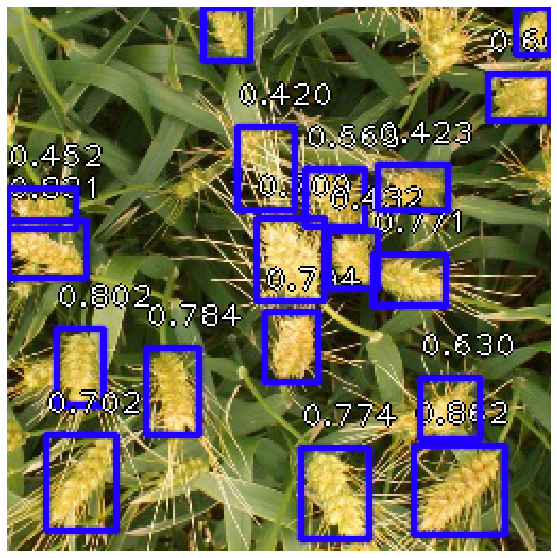

==========   ORG   ==========
[[[234.23138  108.00345  255.       153.60095 ]
  [ 30.839487 185.11389   74.57611  220.21782 ]
  [ 16.55287  115.26868   51.598427 145.41595 ]
  ...
  [ 31.40526    0.        57.567486  14.936169]
  [  0.        89.01568   17.12774  112.917244]
  [ 75.73047   89.59006  105.79873  132.08322 ]]]
(4,)


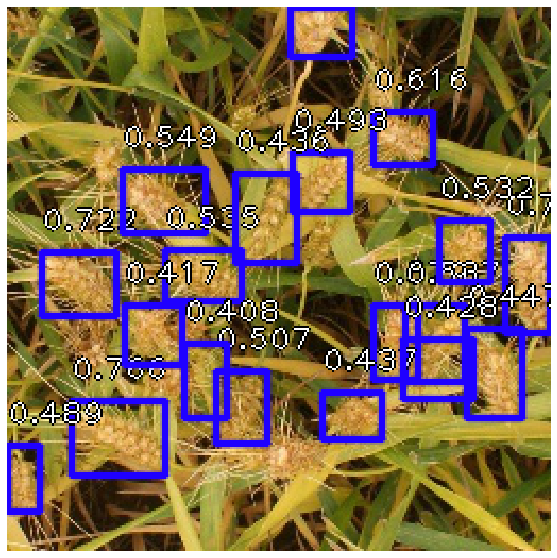

==========   ORG   ==========
[[[  0.       107.93371   25.288902 180.71565 ]
  [176.97429  205.87328  240.51767  233.54985 ]
  [150.6125   190.86945  191.93039  216.6656  ]
  ...
  [102.53012  126.87015  131.73212  154.7524  ]
  [105.55054   76.386086 213.84938  131.18236 ]
  [229.61409  137.08084  255.       179.10349 ]]]
(4,)


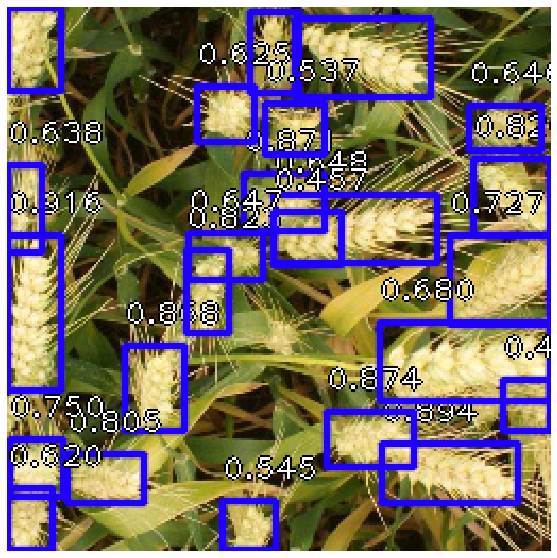

==========   ORG   ==========
[[[173.10446    97.97109   202.89934   141.859    ]
  [203.8517    173.16718   229.88223   224.02432  ]
  [ 16.60883     0.         42.794094   39.187157 ]
  ...
  [158.39932   224.82816   189.11995   249.32628  ]
  [ 46.227467  171.82486    75.39961   200.72913  ]
  [162.94846     3.5191116 209.53226    42.800262 ]]]
(4,)


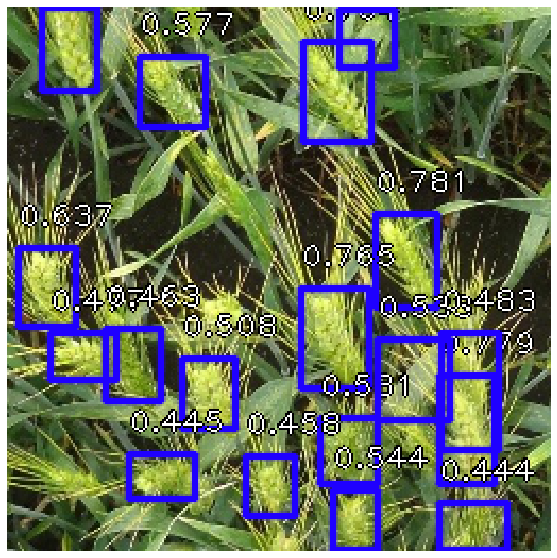

==========   ORG   ==========
[[[ 72.74584   70.42601   95.82065  102.247475]
  [  7.86005   21.616238  50.997326  51.965263]
  [170.54355  207.4218   203.52507  231.68535 ]
  ...
  [243.07176  223.50616  255.       252.08272 ]
  [  4.286805  12.009623  62.320675  58.180984]
  [157.41534  212.22711  193.08684  236.4761  ]]]
(4,)


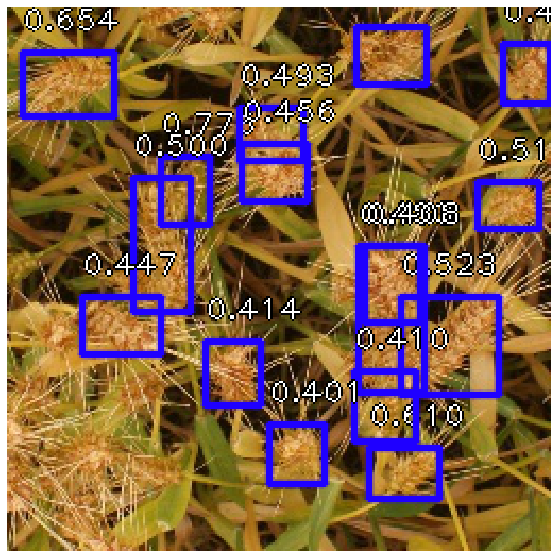

==========   ORG   ==========
[[[151.60721   20.19888  192.22739   60.129627]
  [216.333     73.24966  243.94955  111.3781  ]
  [219.79424  164.98196  253.82033  187.5957  ]
  ...
  [182.73598  142.86702  245.89272  174.15117 ]
  [ 46.78355   90.96467   84.49203  110.8931  ]
  [ 40.66394  175.7461    62.198486 211.25992 ]]]
(4,)


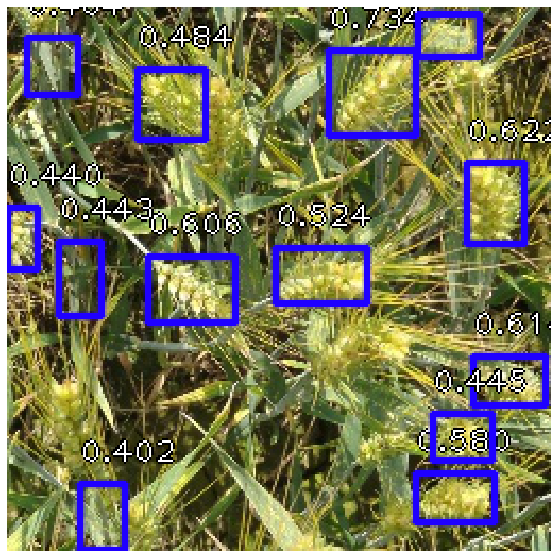

In [38]:
THRES_SCORE = 0.4

for img in li:
    show_detected_objects(img, THRES_SCORE)

==========   ORG   ==========
[[[183.438     55.36637  217.86572   77.47727 ]
  [148.19098  110.57888  181.02885  137.05692 ]
  [  0.        78.744156  30.265114 104.456215]
  ...
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]]]
(4,)


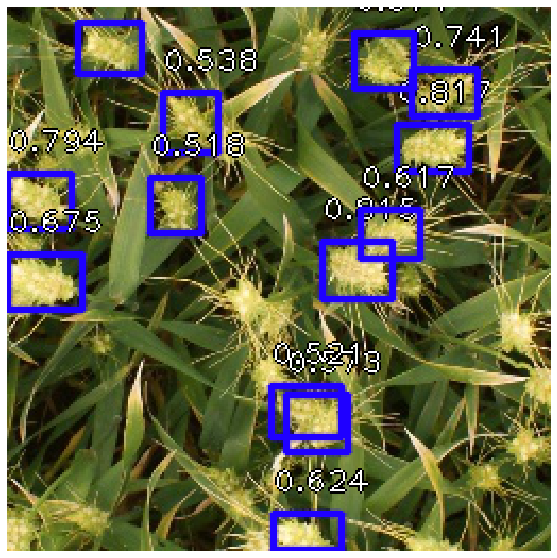

==========   ORG   ==========
[[[  6.0541964 137.94435    50.80122   165.73979  ]
  [171.05432    28.141678  192.14648    69.63561  ]
  [ 76.00964    39.890907  103.66555    92.132805 ]
  ...
  [ -1.         -1.         -1.         -1.       ]
  [ -1.         -1.         -1.         -1.       ]
  [ -1.         -1.         -1.         -1.       ]]]
(4,)


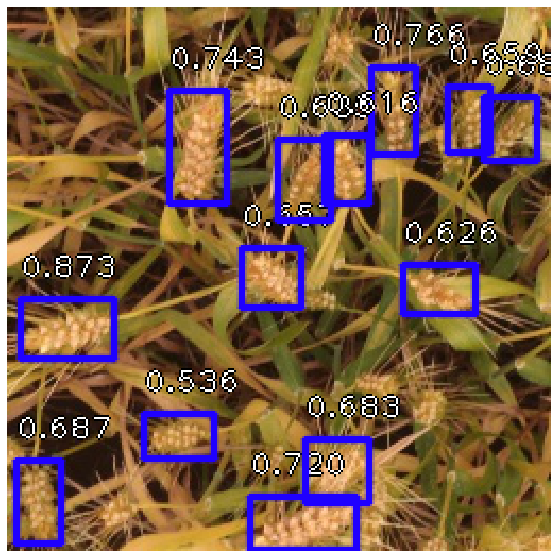

==========   ORG   ==========
[[[112.29272  122.032196 136.80788  158.09161 ]
  [114.37737   86.71717  147.86143  113.24479 ]
  [ 25.675457 144.9076    61.89223  167.8764  ]
  ...
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]]]
(4,)


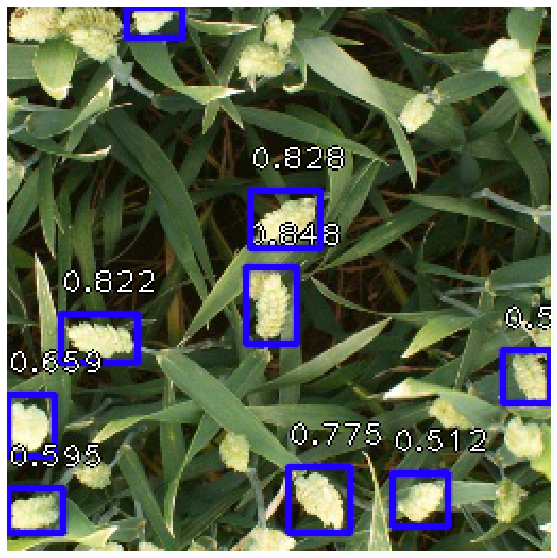

==========   ORG   ==========
[[[  4.4198365 147.74332    35.12231   184.38153  ]
  [230.79593   202.24767   255.        255.       ]
  [  3.1930156   7.456283   38.557064   35.678314 ]
  ...
  [123.16522    72.732155  156.92302    95.517525 ]
  [118.023926  216.41893   146.5046    243.87578  ]
  [104.17146   106.53329   126.781586  142.35997  ]]]
(4,)


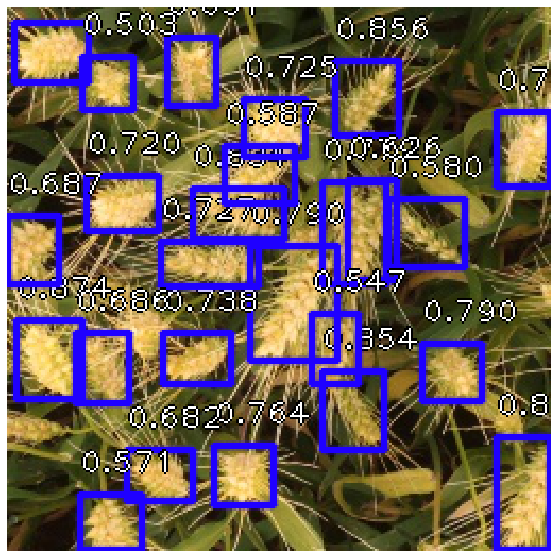

==========   ORG   ==========
[[[191.91812  206.90314  234.35287  248.41902 ]
  [  0.       100.03582   37.339985 127.55583 ]
  [ 23.249243 151.05342   45.644222 187.33553 ]
  ...
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]
  [ -1.        -1.        -1.        -1.      ]]]
(4,)


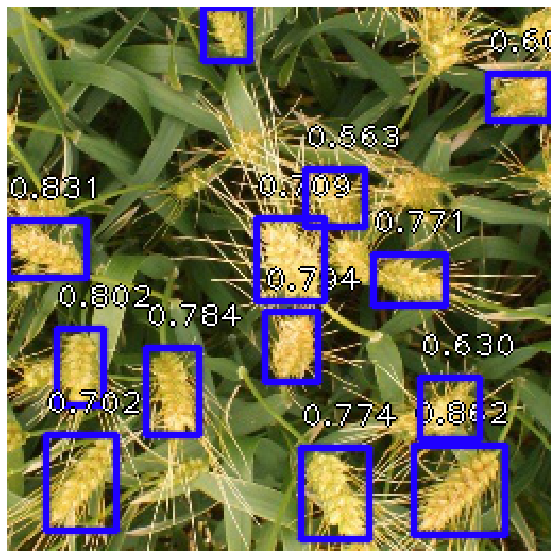

==========   ORG   ==========
[[[234.23138  108.00345  255.       153.60095 ]
  [ 30.839487 185.11389   74.57611  220.21782 ]
  [ 16.55287  115.26868   51.598427 145.41595 ]
  ...
  [ 31.40526    0.        57.567486  14.936169]
  [  0.        89.01568   17.12774  112.917244]
  [ 75.73047   89.59006  105.79873  132.08322 ]]]
(4,)


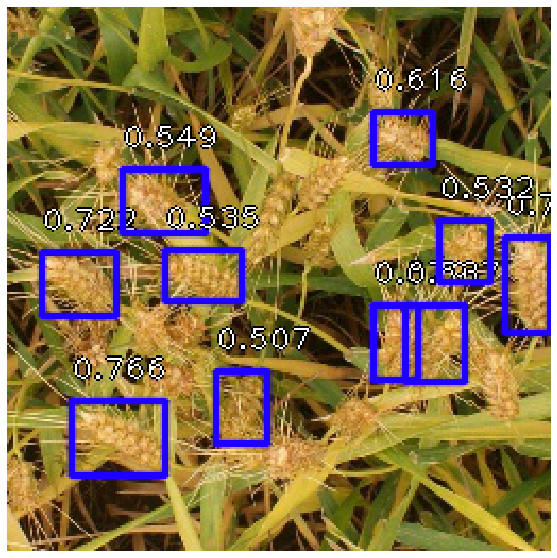

==========   ORG   ==========
[[[  0.       107.93371   25.288902 180.71565 ]
  [176.97429  205.87328  240.51767  233.54985 ]
  [150.6125   190.86945  191.93039  216.6656  ]
  ...
  [102.53012  126.87015  131.73212  154.7524  ]
  [105.55054   76.386086 213.84938  131.18236 ]
  [229.61409  137.08084  255.       179.10349 ]]]
(4,)


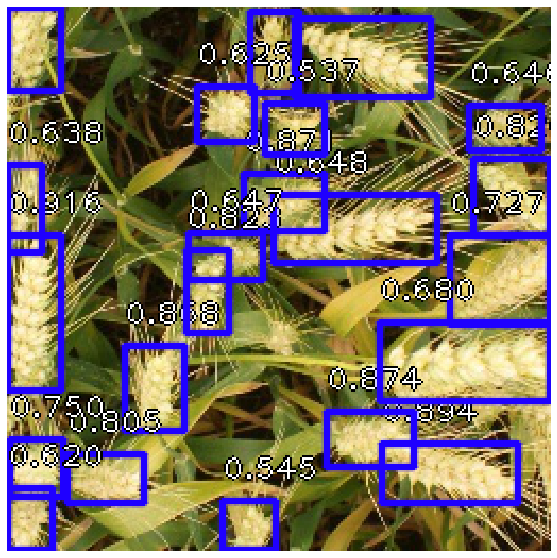

==========   ORG   ==========
[[[173.10446    97.97109   202.89934   141.859    ]
  [203.8517    173.16718   229.88223   224.02432  ]
  [ 16.60883     0.         42.794094   39.187157 ]
  ...
  [158.39932   224.82816   189.11995   249.32628  ]
  [ 46.227467  171.82486    75.39961   200.72913  ]
  [162.94846     3.5191116 209.53226    42.800262 ]]]
(4,)


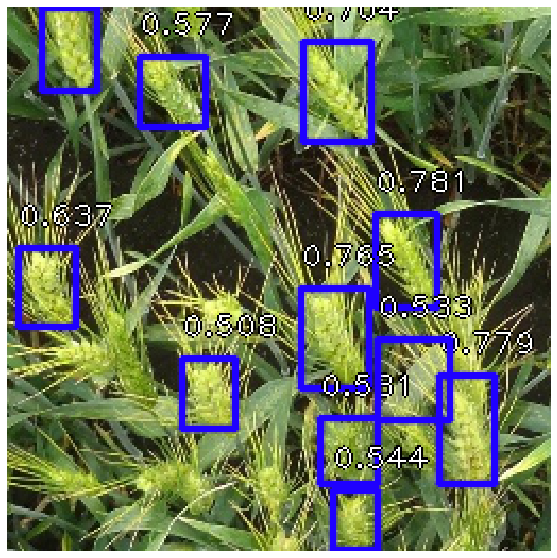

==========   ORG   ==========
[[[ 72.74584   70.42601   95.82065  102.247475]
  [  7.86005   21.616238  50.997326  51.965263]
  [170.54355  207.4218   203.52507  231.68535 ]
  ...
  [243.07176  223.50616  255.       252.08272 ]
  [  4.286805  12.009623  62.320675  58.180984]
  [157.41534  212.22711  193.08684  236.4761  ]]]
(4,)


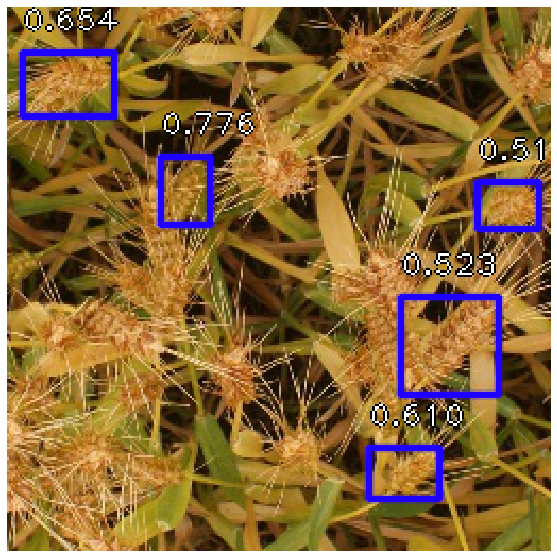

==========   ORG   ==========
[[[151.60721   20.19888  192.22739   60.129627]
  [216.333     73.24966  243.94955  111.3781  ]
  [219.79424  164.98196  253.82033  187.5957  ]
  ...
  [182.73598  142.86702  245.89272  174.15117 ]
  [ 46.78355   90.96467   84.49203  110.8931  ]
  [ 40.66394  175.7461    62.198486 211.25992 ]]]
(4,)


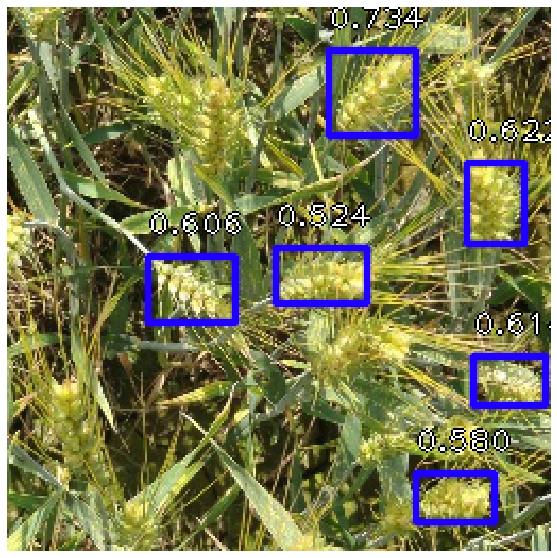

In [37]:
THRES_SCORE = 0.5

for img in li:
    show_detected_objects(img, THRES_SCORE)

On treshold == 0.4 there are some duplicated & false positive binding boxes in predictions, but on treshold == 0.5 a lot of bboxes are ommited. It would be better to split the training set into training & validation set :) and choose the best treshold based on chosen metric (Iou in this kaggle competition).

A fast analysis of the results also shows that the model has a problem with wheat heads that are very "hairy" and matches over-exposed grass (hi contrst between light and dark areas in the picture) in some places as a wheat head. Perhaps an additional dataset and / or augmentation will help at this point.

Longer trainng, of course, would help also. (: